In [1]:
import sys

In [2]:
sys.path.append('..')

In [3]:
#==== IMPORT LIBRARIES======

# GENERAL
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import plotnine as p9
import seaborn as sns
import plotly.express as px
import pickle
from tqdm import tqdm
import json

import os
import cdsapi
import warnings
warnings.filterwarnings("ignore")

# UTILS
from utils.utils import GetCOVID_Dataset
from utils.utils import GetVariants
from utils.utils import ClimateDataProcessor
from utils.utils import region_assign

# Collecting Data

## COVID-19

Fetching COVID-19 daily cases from the Our World in Data Repository (OWID):


In [4]:
# This will fetch the data, preprocess it and save it in '../data/covid/covid19_world.csv'
# GetCOVID_Dataset()
covid_world = pd.read_csv('../data/covid/covid19_world.csv')

Let us take a peak at the daily new cases in Spain starting from 2021:

In [5]:
covid_world.query('country == "Spain" and date >= "2022-01-01"').head(10)[['date','country','new_cases']]

,date,country,new_cases
148865,2022-01-01,Spain,107169.673469
148866,2022-01-02,Spain,113339.714286
148867,2022-01-03,Spain,115362.612245
148868,2022-01-04,Spain,117385.510204
148869,2022-01-05,Spain,119408.408163
148870,2022-01-06,Spain,121431.306122
148871,2022-01-07,Spain,123454.204082
148872,2022-01-08,Spain,125477.102041
148873,2022-01-09,Spain,127500.000000
148874,2022-01-10,Spain,128806.244898


Now we will download COVID data at a NUTS2 level, by using the COVID-19 Data Hub from the `covid19dh` package:

In [6]:
from covid19dh import covid19
covid_eu4, src = covid19(['Germany', 'Italy', 'France'], level=2, verbose=False)

In [7]:
covid_eu4['administrative_area_level_2'] = (covid_eu4
                                             .administrative_area_level_2
                                             .str.replace('<U+00F4>', 'ô', regex=False)
                                             .str.replace('<U+00FC>', 'ü', regex=False)
                                             .str.replace('<U+00E9>', 'é', regex=False)
                                             .str.replace('<U+00F3>', 'ó', regex=False)
                                             .str.replace('<U+00ED>', 'í', regex=False)
                                             .str.replace('<U+00CE>', 'Î', regex=False)
                                             .str.replace('<U+00F1>', 'ñ', regex=False)
)

In [8]:
covid_eu4.iso_alpha_2.unique()

array(['FR', 'IT', 'DE'], dtype=object)

In [9]:
import json

covid_eu4_df = (covid_eu4
                .loc[covid_eu4.iso_alpha_2.isin(['IT', 'DE', 'FR'])]
                .rename(columns={'administrative_area_level_2': 'region',
                                 'iso_alpha_3': 'iso3'})
                [['date', 'iso3', 'region', 'confirmed', 'deaths', 'recovered', 'people_vaccinated','population']]
                .groupby(['iso3', 'region'])
                .apply(lambda dd: dd.sort_values('date').assign(new_cases=lambda dd: dd.confirmed.diff().fillna(0)))
                .reset_index(drop=True)
                .assign(region=lambda dd: dd.region.replace({'Friuli Venezia Giulia': 'Friuli-Venezia Giulia',
                                                         'P.A. Bolzano': 'Provincia Autonoma di Bolzano/Bozen',
                                                         'P.A. Trento': 'Provincia Autonoma di Trento',
                                                         "Provence-Alpes-Côte d'Azur": "Provence-Alpes-Côte d’Azur",
                                                         "Île-de-France": "Ile-de-France",
                                                         "Centre-Val de Loire": "Centre — Val de Loire"
                                                         }))
                .loc[lambda x: ~x.region.isin(['Guadeloupe', 'Guyane', 'La Réunion', 'Martinique', 'Mayotte'])]
               )
covid_eu4_df.to_csv('../data/covid/covid_eu.csv', index=False)

regions_country = covid_eu4_df[['region', 'iso3']].drop_duplicates().set_index('region').to_dict()['iso3']
with open('../data/regions_country.json', 'w') as json_file:
    json.dump(regions_country, json_file)

Additionally, we'll retrieve data on various COVID variants from GISAID, representing the number of analyzed sequences in the preceding week corresponding to each variant group. This data will be fetched and preprocessed using the GetVariants() function.


In [6]:
# This will fetch the data, preprocess it and save it in '../data/gisaid/variants.csv'
#GetVariants()
variants_df = pd.read_csv('../data/gisaid/variants.csv')

Let's take a glance at the structure of this dataset, later on we will deepen into its content:

In [7]:
variants_df.query('country == "Spain"').tail(10)

,country,Week prior to,Type,Value,Submission Count,% per Country and Week,Total per Country and Week
57507,Spain,2024-02-25,Variant,Omicron (B.1.1.529+BA.*),4,0.075,53
57508,Spain,2024-03-03,Variant,Omicron (JN.1+JN.1.*),27,0.844,32
57509,Spain,2024-03-03,Variant,Omicron (EG.5+EG.5.*),2,0.062,32
57510,Spain,2024-03-03,Variant,Omicron (B.1.1.529+BA.*),2,0.062,32
57511,Spain,2024-03-03,Variant,Omicron (XBB.1.5+XBB.1.5.*),1,0.031,32
57512,Spain,2024-03-10,Variant,Omicron (JN.1+JN.1.*),15,0.714,21
57513,Spain,2024-03-10,Variant,Omicron (B.1.1.529+BA.*),5,0.238,21
57514,Spain,2024-03-10,Variant,Omicron (XBB.1.5+XBB.1.5.*),1,0.048,21
57515,Spain,2024-03-17,Variant,Omicron (JN.1+JN.1.*),9,0.900,10
57516,Spain,2024-03-17,Variant,Omicron (B.1.1.529+BA.*),1,0.100,10


## Climate

We are fetching the weather data from the Copernicus Climate Data Store (CDS), which gives us access to (among others) the ERA5 hourly data on single levels from 1979 to present. We download the grid at a 0.5x0.5 degree resolution directly through the API.

For the API calls to work, a client needs to be instantiated which will read the private keys in `/home/$USER/.cdsapirc`:

In this approach, we've crafted a class ClimateDataProcessor() to streamline the retrieval, preprocessing, and concatenation of data into a unified dataframe.

In [8]:
# Create an instance of ClimateDataProcessor
processor = ClimateDataProcessor()

# Call the methods
#processor.retrieve_climate_data()
processor.filter_relevant_coordinates()
processor.compute_relative_absolute_humidity()
climate_05, world, country_to_iso = processor.concat_data()

with open('../data/world_shape.pkl', 'wb') as f:
    pickle.dump(world, f)

In [9]:
country_to_iso.to_csv('../data/country_to_iso.csv', index=False)  

The dataset presents latitude and longitude pairs, each corresponding to a specific country. For each pair, there are four daily climate variables recorded:

In [10]:
climate_05

,date,latitude,longitude,country,temperature,absolute_humidity,relative_humidity,total_precipitation,iso3
0,2021-01-01,54.0,0.0,United Kingdom,6.699073,6.551929,0.858540,10.651238,GBR
1,2021-01-02,54.0,0.0,United Kingdom,5.062257,5.856769,0.854860,5.690321,GBR
2,2021-01-03,54.0,0.0,United Kingdom,5.832740,5.862919,0.813077,8.690738,GBR
3,2021-01-04,54.0,0.0,United Kingdom,5.490612,5.295988,0.750991,4.970659,GBR
4,2021-01-05,54.0,0.0,United Kingdom,5.189369,4.793130,0.693161,2.942576,GBR
...,...,...,...,...,...,...,...,...,...
50740431,2023-01-27,5.0,-0.5,Ghana,27.554675,22.356970,0.827143,0.526053,GHA
50740432,2023-01-28,5.0,-0.5,Ghana,27.467943,22.764808,0.846741,2.755377,GHA
50740433,2023-01-29,5.0,-0.5,Ghana,27.227409,22.417667,0.845176,0.581658,GHA
50740434,2023-01-30,5.0,-0.5,Ghana,27.055246,22.383184,0.852253,0.597023,GHA


In [11]:
print('Number of unique countries in CDS Data: ', len(pd.unique(climate_05['country'])))

Number of unique countries in CDS Data:  176


Let us download climate data again but now on a grid 0.25x0.25 degree resolution, which will be more convenient for a NUTS2 level analysis EU regions:

In [12]:
# Create an instance of ClimateDataProcessor
processor = ClimateDataProcessor()

# Call the methods
#processor.retrieve_climate_data(grid_size = [.25, .25])
processor.filter_relevant_coordinates(grid_size = [.25, .25])
processor.compute_relative_absolute_humidity(grid_size = [.25, .25])
climate_025, _, _ = processor.concat_data(grid_size = [.25, .25])

2024-06-27 00:13:15,299 INFO Welcome to the CDS
2024-06-27 00:13:15,300 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/reanalysis-era5-single-levels
2024-06-27 00:13:15,386 INFO Request is queued
2024-06-27 00:13:16,427 INFO Request is running
2024-06-27 00:14:30,635 INFO Request is completed
2024-06-27 00:14:30,636 INFO Downloading https://download-0014-clone.copernicus-climate.eu/cache-compute-0014/cache/data8/adaptor.mars.internal-1719440050.5147583-9539-16-04e27ca3-9d53-4bc9-9b2c-74b20feb5772.nc to ..\data\climate\grid_0.25/2023_01_0_weather.nc (16.8M)
2024-06-27 00:14:32,833 INFO Download rate 7.6M/s   
2024-06-27 00:14:32,913 INFO Welcome to the CDS
2024-06-27 00:14:32,914 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/reanalysis-era5-single-levels
2024-06-27 00:14:32,990 INFO Request is queued
2024-06-27 00:14:34,028 INFO Request is running
2024-06-27 00:15:48,228 INFO Request is completed
2024-06-27 00:15:48,229 INFO Downl

In [13]:
nuts2 = gpd.read_file('https://gisco-services.ec.europa.eu/distribution/v2/'
                      'nuts/shp/NUTS_RG_10M_2021_4326_LEVL_2.shp.zip')

In [14]:
nuts1 = (gpd.read_file('https://gisco-services.ec.europa.eu/distribution/v2/'
                      'nuts/shp/NUTS_RG_10M_2021_4326_LEVL_1.shp.zip')
         .loc[lambda dd: dd['CNTR_CODE'].isin(['DE', 'FR'])]
        )

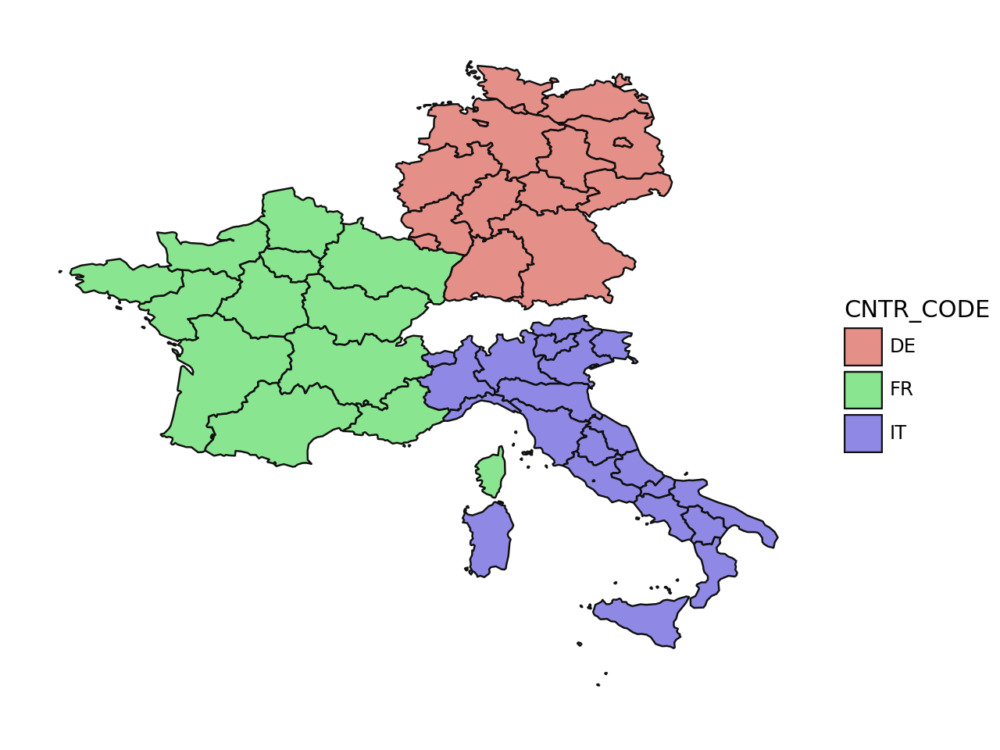

<Figure Size: (640 x 480)>

In [15]:
eu4_regions = (nuts2
                 .loc[lambda dd: dd.CNTR_CODE.isin(['IT'])]
                 .pipe(lambda dd: pd.concat([dd, nuts1]))
                 .pipe(lambda dd: pd.concat([dd, dd.geometry.bounds], axis=1))
                 .loc[lambda dd: dd.minx>-10]
                 .loc[lambda dd: dd.miny > 20]
            )

eu4_regions.pipe(lambda dd: p9.ggplot(dd)
                 + p9.geom_map(p9.aes(fill='CNTR_CODE'), alpha=.7)
                 + p9.theme_void())

In [16]:
lon_lat_region_025 = (climate_025
                  [['longitude', 'latitude']]
                  .drop_duplicates()
                  .assign(region=lambda dd:
                          [region_assign(lon, lat, eu4_regions, 'NUTS_NAME', .25)
                           for lon, lat in tqdm(zip(dd.longitude, dd.latitude),
                                                     leave=False, total=dd.shape[0])])
                  .dropna()
)
lon_lat_region_025.to_csv('../data/coords_region_EU_regions.csv')

## What is the average temperature (°C) in each country?

In [17]:
# Define custom color palette resembling RdBu
custom_palette = ["#053061", "#2166ac", "#4393c3", "#92c5de", "#d1e5f0",
                  "#f7f7f7", "#fddbc7", "#f4a582", "#d6604d", "#b2182b"]

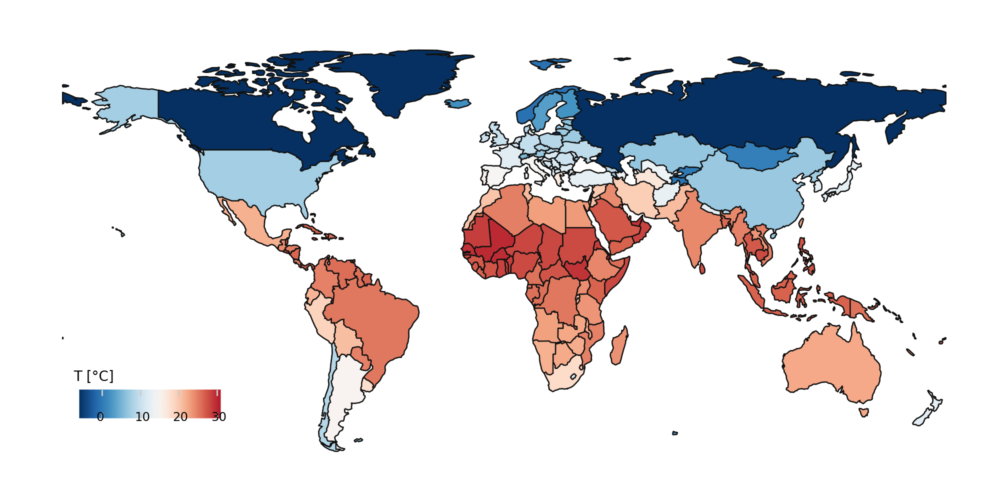

<Figure Size: (1000 x 500)>

In [18]:
f_t = (climate_05
       .groupby('country',as_index=False)
       .mean(numeric_only=True)
       .merge(world)
 .pipe(lambda dd: p9.ggplot(dd) 
      + p9.aes(fill='temperature')
      + p9.geom_map(data=world, fill='gray')
      + p9.geom_map()
      + p9.scale_fill_gradientn(colors=custom_palette, limits=(-5, 30))
      + p9.theme_void()
      + p9.labs(fill='T [°C]')
      + p9.theme(figure_size=(10, 5), legend_position=(.15, .20), legend_key_size=14,
                      legend_title=p9.element_text(size=10)))
)
#p9.ggsave(f_t, '../../results/figures/t_map.pdf')
f_t

## What is the average absolute humidity (g/m³) in each country?

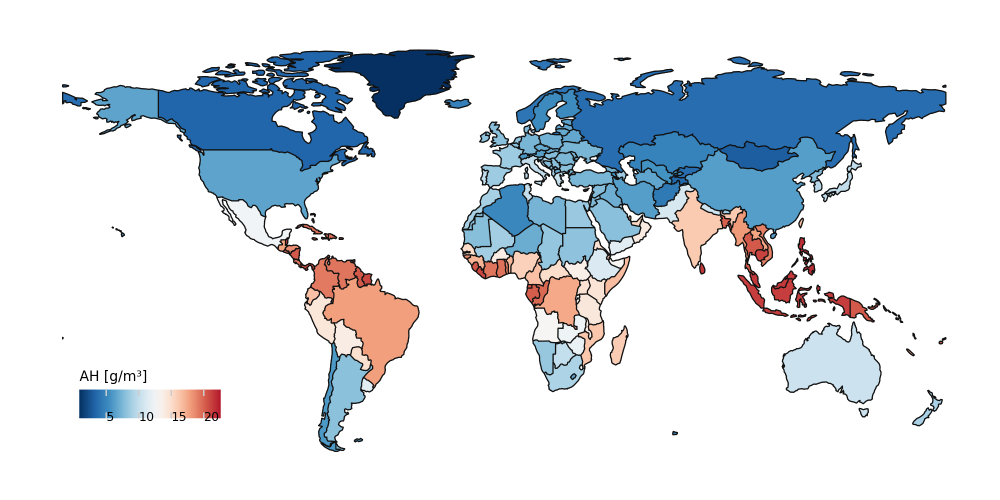

<Figure Size: (1000 x 500)>

In [19]:
f_t = (climate_05
       .groupby('country',as_index=False)
       .mean(numeric_only=True)
       .merge(world)
 .pipe(lambda dd: p9.ggplot(dd) 
      + p9.aes(fill='absolute_humidity')
      + p9.geom_map(data=world, fill='gray')
      + p9.geom_map()
      + p9.scale_fill_gradientn(colors=custom_palette)
      + p9.theme_void()
      + p9.labs(fill='AH [g/m³]')
      + p9.theme(figure_size=(10, 5), legend_position=(.15, .20), legend_key_size=14,
                      legend_title=p9.element_text(size=10)))
)
#p9.ggsave(f_t, '../../results/figures/t_map.pdf')
f_t

## COVID-19 Confirmed Cases

In [124]:
import plotly.express as px

fig = px.line(covid_world, x='date', y='new_cases', color='country', line_group='country',
              title='Daily new confirmed COVID-19 cases',
              labels={'new_cases': 'Number of cases', 'date': 'Date'},
              category_orders={'country': sorted(covid_world['country'].unique())},
              width=1000, height=600,
              template='plotly_white')

fig.update_yaxes(tickformat=",.0f")

# Add vertical lines
#fig.add_vline(x='2021-12-01', line=dict(color="blue", width=2, dash="dash"))
#fig.add_vline(x='2023-02-28', line=dict(color="blue", width=2, dash="dash"))

fig.show()

In [137]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go


# Calculate new cases per 100,000 people
covid_world['new_cases_per_100k'] = covid_world['new_cases'] / (covid_world['population'] / 100000)

# Aggregate data to get mean and std for each date globally
world_total = (covid_world
               .groupby('date')['new_cases_per_100k']
               .agg(['mean', 'std'])
               .reset_index()
               .assign(country='World')
              )

fig = px.line(world_total, x='date', y='mean',
              labels={'mean': 'Mean cases per 100,000', 'date': 'Date'},
              width=1400, height=800,
              template='plotly_white')

# Add shaded region for standard deviation
world_total['upper'] = world_total['mean'] + world_total['std']
world_total['lower'] = world_total['mean'] - world_total['std']

# Ensure lower bound does not go below 0
world_total['lower'] = world_total['lower'].clip(lower=0)

fig.add_traces([
    go.Scatter(
        x=world_total['date'], 
        y=world_total['upper'], 
        mode='lines', 
        line=dict(width=0),
        fill='tonexty',
        fillcolor='rgba(0,100,80,0.2)',
        showlegend=False,
        hoverinfo='skip'
    ),
    go.Scatter(
        x=world_total['date'], 
        y=world_total['lower'], 
        mode='lines', 
        line=dict(width=0),
        fill='tonexty',
        fillcolor='rgba(0,100,80,0.2)',
        showlegend=False,
        hoverinfo='skip'
    )
])

# Add red dots at specific dates
red_dot_dates = ['2021-12-19', '2023-01-31']
for date in red_dot_dates:
    date_data = world_total[world_total['date'] == date]
    fig.add_trace(go.Scatter(
        x=date_data['date'],
        y=date_data['mean'],
        mode='markers',
        marker=dict(color='red', size=10),
        name='Red Dot',
        showlegend=False,
        hoverinfo='skip'
    ))

# Add annotation next to red dot
    fig.add_annotation(
        x=date_data['date'].iloc[0],  # X coordinate of the annotation (date of the red dot)
        y=date_data['mean'].iloc[0],  # Y coordinate of the annotation (mean value)
        text=date,  # Text to display in the annotation box (date)
        showarrow=True,  # Display arrow pointing to the annotation
        arrowhead=2,  # Arrowhead style
        ax=-30,  # X coordinate shift of the arrow (pixels)
        ay=-40,  # Y coordinate shift of the arrow (pixels)
        arrowwidth=2,  # Width of the arrow
        arrowcolor="red",  # Color of the arrow
        bgcolor="white",  # Background color of the annotation box
        bordercolor="black",  # Border color of the annotation box
        borderwidth=1,  # Border width of the annotation box
        borderpad=4,  # Padding of the border around the text
        opacity=0.8,  # Opacity of the annotation box
        font=dict(size=10)  # Font size of the text inside the annotation box
    )

fig.show()
#!pip install kaleido-0.1.0.post1-py2.py3-none-win_amd64.whl
fig.write_image("daily_new_covid_cases.png", width=1200, height=800, scale=5)

## What was the distribution of COVID variants through time?

In [115]:
country_groups = pd.read_csv('../data/country_groups.csv').sort_values('group')

In [116]:
selected_variants_df = variants_df[variants_df['Value'] != 'Other'].merge(country_to_iso)

In [105]:
# Convert 'Week prior to' to datetime format and extract the month and year
selected_variants_df['Week prior to'] = pd.to_datetime(selected_variants_df['Week prior to'])
selected_variants_df['YearMonth'] = selected_variants_df['Week prior to'].dt.to_period('M')

# Aggregate data by month, country, and variant to get the total number of submissions per variant per month per country
monthly_variant_data = selected_variants_df.groupby(['YearMonth', 'country', 'Value'])['Submission Count'].sum().reset_index()

# Aggregate data by month and country to get the total number of submissions per month per country
monthly_country_data = selected_variants_df.groupby(['YearMonth', 'country'])['Submission Count'].sum().reset_index()

# Merge the two dataframes on 'YearMonth' and 'country'
merged_data = pd.merge(monthly_variant_data, 
                       monthly_country_data, 
                       on=['YearMonth', 'country'], 
                       how='left')

# Calculate the percentage of submissions for each variant per month per country
merged_data['Percentage'] = merged_data['Submission Count_x'] / merged_data['Submission Count_y']

# Filter for Omicron
merged_data = merged_data[merged_data['Value']=='Omicron (B.1.1.529+BA.*)']

# Calculate the world average percentage for each month
world_avg = merged_data.groupby('YearMonth')['Percentage'].mean().reset_index()
world_avg['country'] = 'World'

# Combine the world average data with the original data
plot_data = pd.concat([merged_data, world_avg], ignore_index=True)
plot_data['country_or_world'] = plot_data['country'].apply(lambda x: 'World' if x == 'World' else 'countries')
plot_data.rename(columns={"country":"name"},inplace=True)

# Convert 'YearMonth' back to datetime for plotting
plot_data['YearMonth'] = plot_data['YearMonth'].dt.to_timestamp()

# Create the line plot
fig = px.line(plot_data, 
              x='YearMonth', 
              y='Percentage',
              color = 'country_or_world',
              line_group = 'name',
              color_discrete_map={'World': '#1f77b4', 'countries': 'lightgray'},
              labels={'YearMonth': 'Month', 'Percentage': 'Percentage of Submissions'},
              width=1400, height=800,
              template='plotly_white'
              )

# Update line thickness for 'World'
fig.update_traces(selector=dict(name='World'), 
                  mode='lines+markers',
                  line=dict(width=5), 
                  marker=dict(size=10)
                  )

# Adjust legend position and orientation
fig.update_layout(
    legend=dict(
        orientation='h',  # Horizontal orientation
        yanchor='bottom',  # Anchor legend to bottom of the figure
        y=1.02,  # Position vertically above the plot
        xanchor='right',  # Anchor legend to the right side
        x=1  # Position horizontally within the figure
    )
)

# Update x-axis formatting
fig.update_xaxes(title='Month', tickformat='%b %Y', dtick='M3') 

fig.show()
fig.write_image("omicron_trend.png", width=1200, height=800, scale=5)


In [127]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

selected_variants_df = variants_df[variants_df['Value'] != 'Other'].merge(country_to_iso)

# Assuming 'Week prior to' is already in datetime format
selected_variants_df['Week prior to'] = pd.to_datetime(selected_variants_df['Week prior to'])

# Calculate the start and end dates for each week prior to date
selected_variants_df['Week start'] = selected_variants_df['Week prior to'] - pd.DateOffset(weeks=1)
selected_variants_df['Week end'] = selected_variants_df['Week prior to'] - pd.DateOffset(days=1)

# Aggregate data by calculated week interval, country, and variant to get the total number of submissions per variant per week per country
weekly_variant_data = selected_variants_df.groupby(['Week start', 'Week end', 'country', 'Value'])['Submission Count'].sum().reset_index()

# Aggregate data by calculated week interval and country to get the total number of submissions per week per country
weekly_country_data = selected_variants_df.groupby(['Week start', 'Week end', 'country'])['Submission Count'].sum().reset_index()

# Merge the two dataframes on calculated week intervals and 'country'
merged_data = pd.merge(weekly_variant_data, 
                       weekly_country_data, 
                       on=['Week start', 'Week end', 'country'], 
                       how='left')

# Calculate the percentage of submissions for each variant per week per country
merged_data['Percentage'] = merged_data['Submission Count_x'] / merged_data['Submission Count_y']

# Filter for Omicron
merged_data = merged_data[merged_data['Value']=='Omicron (B.1.1.529+BA.*)']

# Calculate the world average percentage for each week
world_avg = merged_data.groupby(['Week start', 'Week end'])['Percentage'].mean().reset_index()
world_avg['country'] = 'World'

# Combine the world average data with the original data
plot_data = pd.concat([merged_data, world_avg], ignore_index=True)
plot_data['country_or_world'] = plot_data['country'].apply(lambda x: 'World' if x == 'World' else 'countries')
plot_data.rename(columns={"country":"name"}, inplace=True)

# Create the line plot
fig = px.line(plot_data, 
              x='Week end', 
              y='Percentage',
              color='country_or_world',
              line_group='name',
              color_discrete_map={'World': '#1f77b4', 'countries': 'lightgray'},
              labels={'Week end': 'Week', 'Percentage': 'Percentage of Submissions'},
              width=1400, height=800,
              template='plotly_white'
              )

# Update line thickness for 'World'
fig.update_traces(selector=dict(name='World'), 
                  mode='lines+markers',
                  line=dict(width=5), 
                  marker=dict(size=10)
                  )

# Adjust legend position and orientation
fig.update_layout(
    legend=dict(
        orientation='h',  # Horizontal orientation
        yanchor='bottom',  # Anchor legend to bottom of the figure
        y=1.02,  # Position vertically above the plot
        xanchor='right',  # Anchor legend to the right side
        x=1  # Position horizontally within the figure
    )
)

# Update x-axis formatting
fig.update_xaxes(title='Week', tickformat='%Y-%m-%d', dtick='M1') 

fig.show()
fig.write_image("omicron_trend_weekly.png", width=1200, height=800, scale=5)
